Version 3 1/5/2024  
Pipeline to process MERSCOPE experiments as they come in.  
Want to organize sections with only relevant metadata from new services and have ability to attach analysis status.  
To do this, trying out a SpatialDataset Class that will hold this information and could be made into a dashboard.  

The pipeline has the following basic steps:  
1. Pull metadata from new services
2. Assessment of total counts and corrlation to bulkseq
3. Re-segmentation using custom Cellpose model
4. QC of cells and filtering out low quality ones
5. Doublet detection using SOLO
6. Creation of AnnData object for primary analysis
7. Mapping with scrattch-mapping
8. First stage analysis of mapping  

This notebook should be able to run by providing the MERSCOPE barcode 

In [1]:
import os, sys
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import importlib
import sawg
from sawg import spatial_dataset as spd

from sawg import ScrattchMapping
from sawg import SpotTable
from sawg.segmentation import MerscopeSegmentationRun
from sawg.spatial_dataset import MERSCOPESection
from sawg.util import plot_cbg_centroids

In [2]:
barcode = 1291816006
broad_region = 'Basal Ganglia'

In [3]:
merscope_section = MERSCOPESection(barcode)

SpatialDataset already exists and will be loaded. If you want to reprocess this dataset delete the file and start over
SpatialDataset \\allen\programs\celltypes\workgroups\rnaseqanalysis\NHP_spatial\MERSCOPE\macaque\1291816006\spatial_dataset loaded...
Correlation to bulk already calculated: 0.73
Segmentation timestamps: 	 Segmentation info
20240108_145736: 	 {'finished': True, 'subrgn': 'DAPI', 'seg_method': 'sawg.segmentation.CellposeSegmentationMethod', 'seg_opts': "{'options': {'region': None, 'cellpose_model': '/allen/programs/celltypes/workgroups/rnaseqanalysis/mFISH/spatial_bioinformatics/models/cellpose_20230919_3species_merscope', 'cellpose_gpu': 'auto', 'px_size': 0.108, 'cell_dia': 10, 'z_plane_thickness': 1.5, 'images': {'cyto': {'channel': 'total_mrna', 'n_planes': 7}, 'nuclei': {'channel': 'DAPI'}}, 'cellpose_options': {'batch_size': 8, 'min_size': 5000}}}"}
No mappings found


In [4]:
merscope_section.broad_region = broad_region
merscope_section.save_dataset()

Loading csv..
Recompressing to npz..


C:\Users\stephanies\AppData\Local\Continuum\miniconda3\envs\sawg_env\Lib\site-packages\pandas\core\arraylike.py:396: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


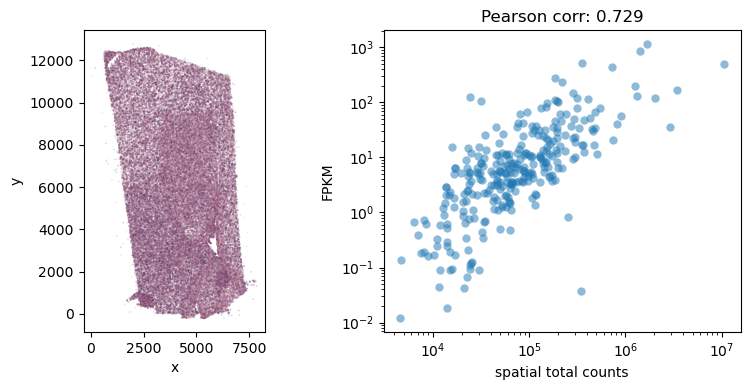

In [5]:
merscope_section.spatial_corr_to_bulk()

Loading from npz..


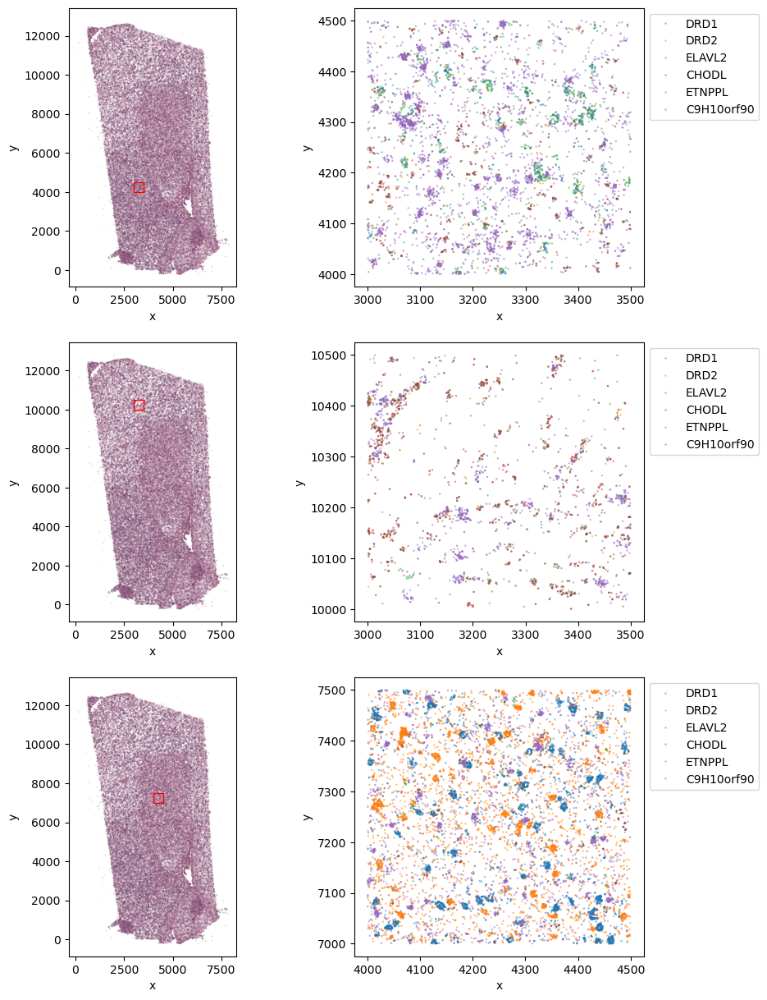

In [11]:
# Pick some subregions for visual sanity checks
# Adjust locations of subregions as needed
genes = ['DRD1', 'DRD2', 'ELAVL2', 'CHODL', 'ETNPPL', 'C9H10orf90']  
subregions = [
    ((3000, 3500), (4000, 4500)),
    ((3000, 3500), (10000, 10500)),
    ((4000, 4500), (7000, 7500))
]

merscope_section.show_gene_transcripts(genes=genes, subregions=subregions)

## Segmentation

Resegment using a custom Cellpose model.

In [4]:
# Display any subdirectories currently in the segmentation directory
# And whether they contain the final output file (the cell by gene table)
merscope_section.check_segmentation_status()

{'20240108_145736': {'finished': True,
  'subrgn': 'DAPI',
  'seg_method': 'sawg.segmentation.CellposeSegmentationMethod',
  'seg_opts': "{'options': {'region': None, 'cellpose_model': '/allen/programs/celltypes/workgroups/rnaseqanalysis/mFISH/spatial_bioinformatics/models/cellpose_20230919_3species_merscope', 'cellpose_gpu': 'auto', 'px_size': 0.108, 'cell_dia': 10, 'z_plane_thickness': 1.5, 'images': {'cyto': {'channel': 'total_mrna', 'n_planes': 7}, 'nuclei': {'channel': 'DAPI'}}, 'cellpose_options': {'batch_size': 8, 'min_size': 5000}}}"}}

### Define segmentation parameters

These can also be defined and loaded into a JSON file.

In [14]:
#subrgn = ((5500, 6000), (5500, 6000))
# For full run, use all of the imaging region
subrgn = 'DAPI'
path_to_model = '/allen/programs/celltypes/workgroups/rnaseqanalysis/mFISH/spatial_bioinformatics/models/cellpose_20230919_3species_merscope'
seg_method = sawg.segmentation.CellposeSegmentationMethod
seg_opts = dict(options={
    'region': None,
    'cellpose_model': path_to_model,
    'cellpose_gpu': 'auto',
    'px_size': 0.108,          # um / px
    'cell_dia': 10,            # um
    'z_plane_thickness': 1.5,  # um
    'images': {
        'cyto': {'channel': 'total_mrna', 'n_planes': 7}, 
        'nuclei': {'channel': 'DAPI'}
    }, 
    'cellpose_options': {
        'batch_size': 8,
        'min_size': 5000
    },
})
hpc_opts = {
    'conda_env': '/home/madeleine.hewitt/miniconda3/envs/seg_demo/',
    'hpc_host': 'hpc-login',  # change to 'hpc-login' if running locally
    'mem': '25G'
}

### Run a new segmentation, OR load an existing one

In [5]:
# To run a new segmentation:
# timestamp, spot_table, cell_by_gene = merscope_section.run_segmentation_on_section(subrgn, seg_method, seg_opts, hpc_opts)

# To load an existing segmentation (using a timestamp):
timestamp = '20240108_145736'
spot_table, cell_by_gene = merscope_section.load_segmentation_results(timestamp)

C:\Users\stephanies\AppData\Local\Continuum\miniconda3\envs\sawg_env\Lib\site-packages\anndata\_core\anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


Loading from npz..


In [7]:
this_seg_dir = merscope_section.segmentation_path.joinpath(timestamp)

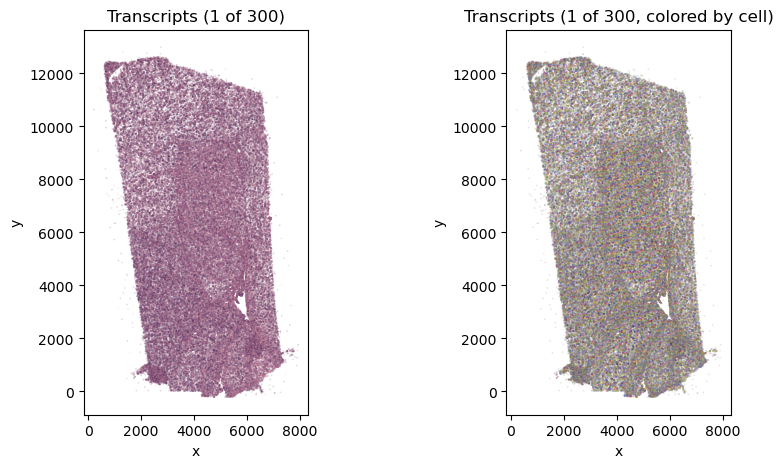

In [9]:
spots = 300
fig, ax = plt.subplots(ncols=2, figsize=(10, 5))
spot_table[::spots].scatter_plot(ax=ax[0])
ax[0].set_title(f'Transcripts (1 of {spots})')
spot_table[::spots].scatter_plot(ax=ax[1], color='cell')
ax[1].set_title(f'Transcripts (1 of {spots}, colored by cell)')

plot_path = this_seg_dir / 'transcripts_overview.png'
plt.savefig(plot_path, dpi=300)

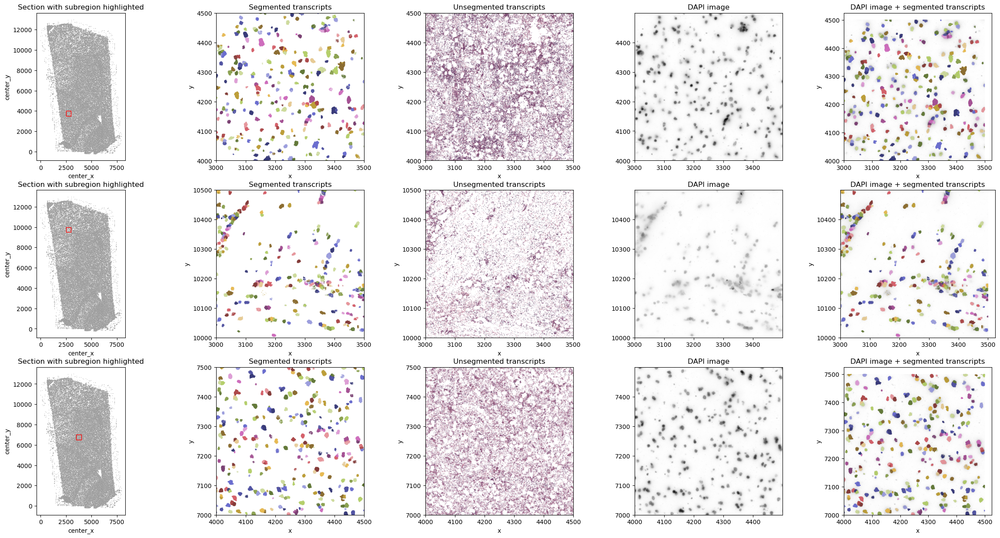

In [12]:
from matplotlib.patches import Rectangle
nrows = len(subregions)
fig, ax = plt.subplots(nrows=nrows, ncols=5, figsize=(30, nrows*5))

for i, subrgn in enumerate(subregions):
    plot_cbg_centroids(cell_by_gene, color='grey', s=1, alpha= 0.5, ax=ax[i, 0])
    ax[i, 0].set_aspect('equal', adjustable='box', anchor='C')
    ax[i, 0].add_patch(Rectangle((subrgn[0][0], subrgn[1][0]), (subrgn[0][0] - subrgn[0][1]), (subrgn[1][0] - subrgn[1][1]), facecolor="none", edgecolor='red'))
 
    subtable = spot_table.get_subregion(xlim=subrgn[0], ylim=subrgn[1])
    subtable.filter_cells(real_cells=True).scatter_plot(color='cell', ax=ax[i, 1])
    subtable[subtable.cell_ids <= 0].scatter_plot(ax=ax[i, 2])
    subtable.get_image(channel='DAPI').show(ax=ax[i, 3], cmap='gray_r')
    subtable.get_image(channel='DAPI').show(ax=ax[i, 4], cmap='gray_r')
    subtable.filter_cells(real_cells=True).scatter_plot(color='cell', ax=ax[i, 4])

    ax[i, 1].set_xlim(subrgn[0])
    ax[i, 1].set_ylim(subrgn[1])
    ax[i, 2].set_xlim(subrgn[0])
    ax[i, 2].set_ylim(subrgn[1])

    ax[i, 0].set_title('Section with subregion highlighted')
    ax[i, 1].set_title('Segmented transcripts')
    ax[i, 2].set_title('Unsegmented transcripts')
    ax[i, 3].set_title('DAPI image')
    ax[i, 4].set_title('DAPI image + segmented transcripts')

    qc_plot_path = this_seg_dir / 'segmentation_test_region.png'
    plt.savefig(qc_plot_path, dpi=300)

## QC filtering

Currently supports basic QC filtering (e.g. on number of genes) + Solo doublet detection

To be added: Segmentation evaluation metrics, when implemented into the repo.
Summary plots to be moved to spatial_dataset

In [21]:
qc_params = {
    'n_genes': [20, 300],
    'n_transcripts': [20, 3500],
    'pct_counts_blank': [0, 2]
}

In [22]:
cell_by_gene = merscope_section.calc_cell_qc_metrics(cell_by_gene)

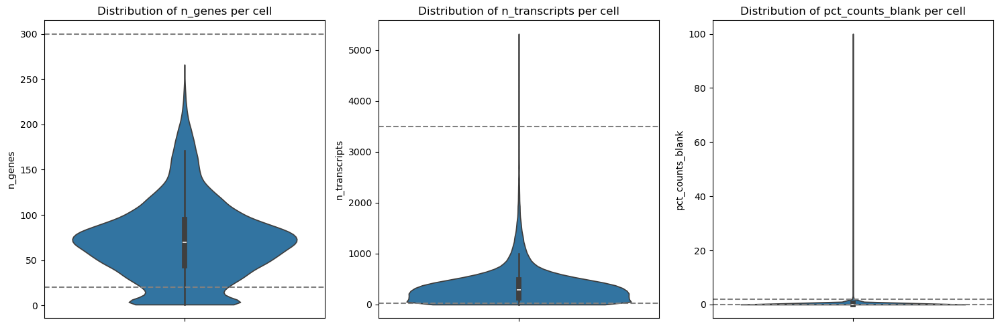

In [23]:
# Plot metrics before filtering
# (more to be added here when we have it)
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

for i, param in enumerate(qc_params):
    sns.violinplot(data=cell_by_gene.obs, y=param, cut=0, ax=ax[i])
    for bound in qc_params[param]:
        ax[i].axhline(bound, color='grey', ls='--')
    
    ax[i].set_title(f'Distribution of {param} per cell')

plt.tight_layout()
qc_plot_path = this_seg_dir / 'qc_violins_prefiltered.png'
plt.savefig(qc_plot_path, dpi=300)

In [24]:
cell_by_gene = merscope_section.run_qc_filtering_on_section(cell_by_gene, qc_params)

c:\users\stephanies\spatial-analysis-wg\code\sawg\util.py:504: UserWarning: The palette list has more values (2) than needed (1), which may not be intended.
  g = sns.scatterplot(data=cell_by_gene.obs, x=x, y=y, ax=ax, **kwargs)
c:\users\stephanies\spatial-analysis-wg\code\sawg\util.py:504: UserWarning: The palette list has more values (2) than needed (1), which may not be intended.
  g = sns.scatterplot(data=cell_by_gene.obs, x=x, y=y, ax=ax, **kwargs)


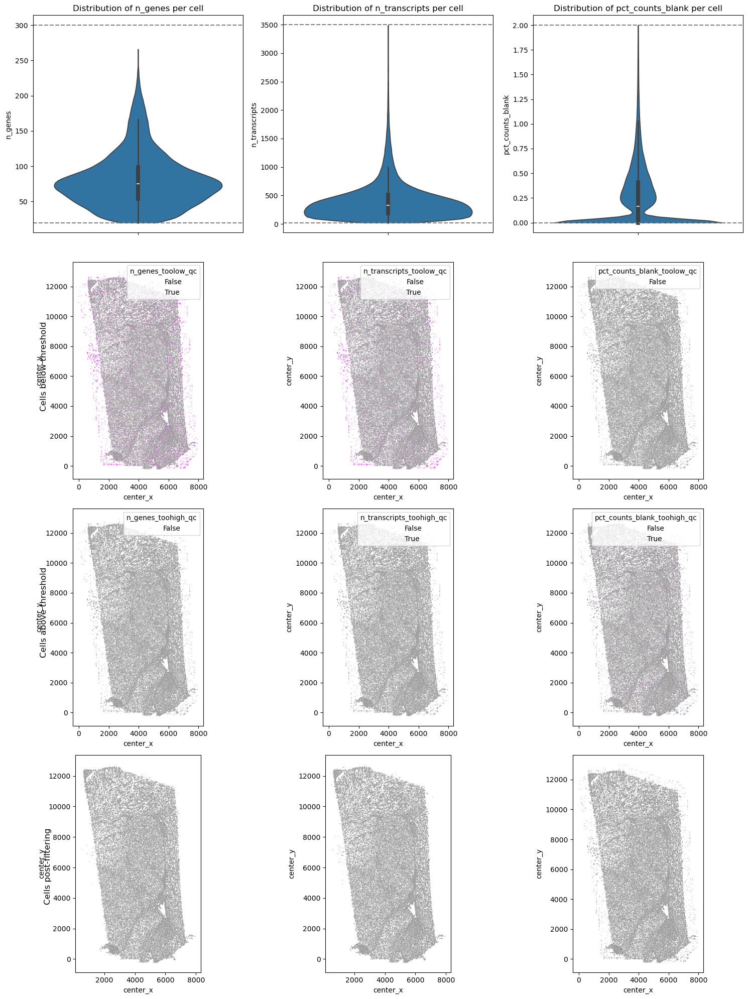

In [25]:
# Plot metrics after filtering
fig, ax = plt.subplots(nrows=4, ncols=3, figsize=(15, 20))

for i, param in enumerate(qc_params):
    sns.violinplot(data=cell_by_gene.obs[cell_by_gene.obs['cell_qc_pass']], y=param, cut=0, ax=ax[0, i])
    for bound in qc_params[param]:
        ax[0, i].axhline(bound, color='grey', ls='--')
        
    plot_cbg_centroids(cell_by_gene, ax=ax[1, i], alpha=0.5, s=1, palette=['gray', 'magenta'], hue=f'{param}_toolow_qc')
    plot_cbg_centroids(cell_by_gene, ax=ax[2, i], alpha=0.5, s=1, palette=['gray', 'magenta'], hue=f'{param}_toohigh_qc')
    cbg_filtered = cell_by_gene[~(cell_by_gene.obs[f'{param}_toolow_qc']|cell_by_gene.obs[f'{param}_toohigh_qc'])]
    plot_cbg_centroids(cbg_filtered, ax=ax[3, i], color='grey', alpha=0.5, s=1)
    
    ax[0, i].set_title(f'Distribution of {param} per cell')
    ax[1, 0].set_title('Cells below threshold', rotation='vertical', x=-0.22, y=0.3)
    ax[2, 0].set_title('Cells above threshold', rotation='vertical', x=-0.22, y=0.3)
    ax[3, 0].set_title('Cells post-filtering', rotation='vertical', x=-0.22, y=0.3)
    

plt.tight_layout()
qc_plot_path = this_seg_dir / 'qc_violins_postfiltered.png'
plt.savefig(qc_plot_path, dpi=300)

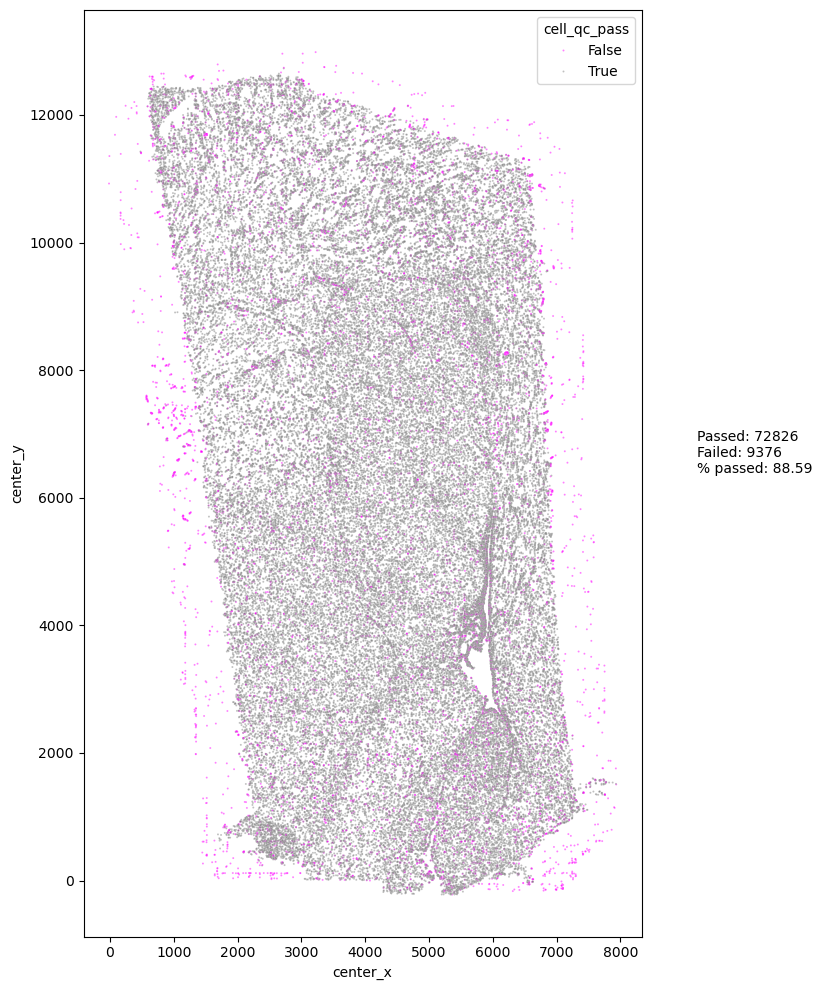

In [26]:
# Plot overall outcome of filtering
fig, ax = plt.subplots(figsize=(10, 10))
plot_cbg_centroids(cell_by_gene, ax=ax, palette=['magenta', 'grey'], s=2, alpha= 0.5, hue='cell_qc_pass')

qc_counts = cell_by_gene.obs['cell_qc_pass'].value_counts()
plt.text(x=1.1, y=0.5, s=f'Passed: {qc_counts.loc[True]}\nFailed: {qc_counts.loc[False]}\n% passed: {100*qc_counts.loc[True]/len(cell_by_gene.obs):.2f}', transform=ax.transAxes)
plt.tight_layout()
qc_plot_path = this_seg_dir / 'qc_failed_cell_locations.png'
plt.savefig(qc_plot_path, dpi=300)

In [32]:
# Check if doublet detection has been run
merscope_section.qc_path = merscope_section.save_path.joinpath('qc_doublets')
merscope_section.check_doublet_detection_status()

{'20240109_100025': {'finished': False},
 '20240109_100047': {'finished': True,
  'doublet_params': {'method': 'solo',
   'method_kwargs': {'threshold': 2},
   'filter_col': 'cell_qc_pass'}}}

In [29]:
# Run Solo doublet detection on an HPC node
method = 'solo'
method_kwargs = {'threshold': 2}
hpc_args = {'hpc_host': 'hpc-login'}
filter_col = 'cell_qc_pass'

cell_by_gene, timestamp = merscope_section.run_doublet_detection_on_section(cell_by_gene, method, method_kwargs, hpc_args, filter_col)

Job ID:  13955153
<JobState PENDING>
<JobState RUNNING>
<JobState RUNNING>
<JobState RUNNING>
<JobState RUNNING>
<JobState RUNNING>
<JobState RUNNING>
<JobState RUNNING>
<JobState RUNNING>
<JobState RUNNING>
<JobState RUNNING>
<JobState RUNNING>
<JobState RUNNING>
<JobState RUNNING>
<JobState RUNNING>
<JobState RUNNING>
<JobState RUNNING>
<JobState RUNNING>
<JobState RUNNING>
<JobState RUNNING>


In [33]:
# If doublet detection already done: load from previous
doublet_timestamp = '20240109_100047'
cell_by_gene = merscope_section.load_doublet_anndata(doublet_timestamp)

In [30]:
cell_by_gene

AnnData object with n_obs × n_vars = 82202 × 315
    obs: 'center_x', 'center_y', 'n_transcripts', 'n_genes', 'pct_counts_blank', 'n_genes_toolow_qc', 'n_genes_toohigh_qc', 'n_transcripts_toolow_qc', 'n_transcripts_toohigh_qc', 'pct_counts_blank_toolow_qc', 'pct_counts_blank_toohigh_qc', 'cell_qc_pass', 'doublet_score'
    uns: 'seg_timestamp', 'seg_params', 'qc_params', 'doublet_timestamp', 'doublet_params'

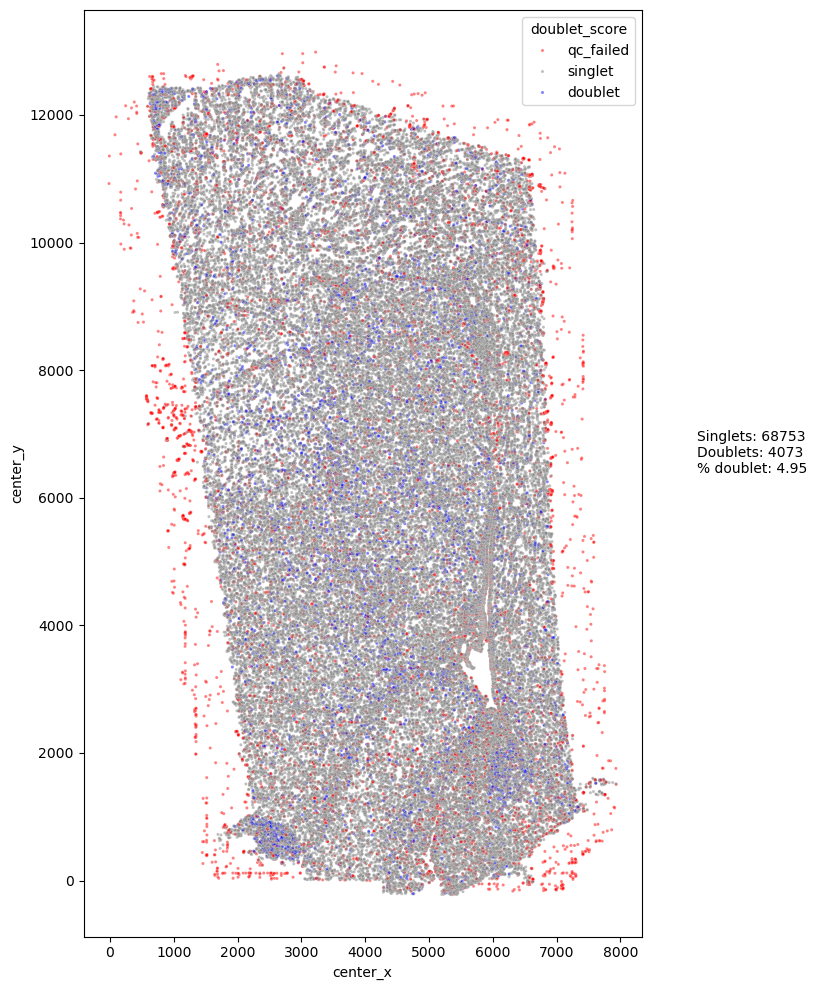

In [36]:
# plot locations of predicted doublets
fig, ax = plt.subplots(figsize=(10, 10))
plot_cbg_centroids(cell_by_gene, ax=ax, palette=['red', 'grey', 'blue'], s=5, alpha= 0.5, hue='doublet_score')

doublet_counts = cell_by_gene.obs['doublet_score'].value_counts()
n_doublets = doublet_counts.loc['doublet']
n_singlets = doublet_counts.loc['singlet']
plt.text(x=1.1, y=0.5, s=f'Singlets: {n_singlets}\nDoublets: {n_doublets}\n% doublet: {100*n_doublets/len(cell_by_gene.obs):.2f}', transform=ax.transAxes)
plt.tight_layout()
qc_plot_path = merscope_section.qc_path / doublet_timestamp / 'pred_doublet_locations.png'
plt.savefig(qc_plot_path, dpi=300)

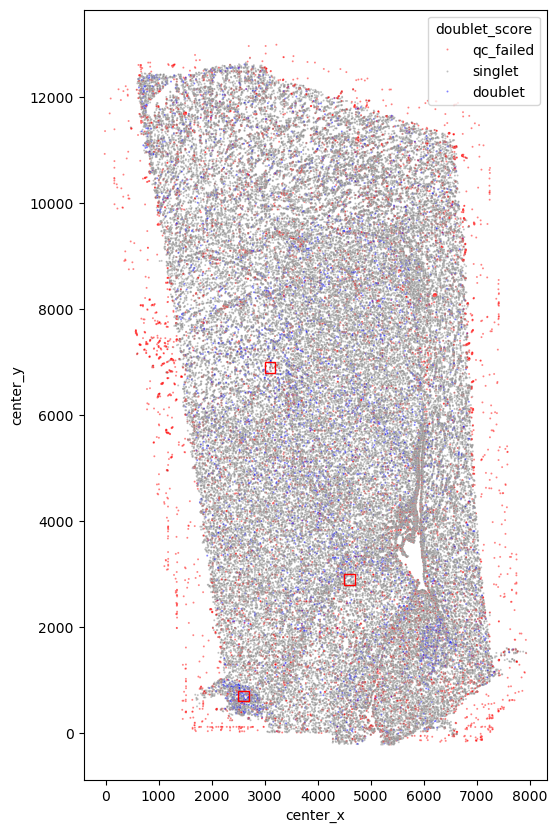

In [43]:
# plot locations of predicted doublets
subrgns = [
    ((3000, 3200), (7000, 7200)), 
    ((2500, 2700), (800, 1000)), 
    ((4500, 4700), (3000, 3200))
]

from matplotlib.patches import Rectangle
fig, ax = plt.subplots(figsize=(10, 10))
plot_cbg_centroids(cell_by_gene, ax=ax, palette=['red', 'grey', 'blue'], s=2, alpha= 0.5, hue='doublet_score')

for subrgn in subrgns:
    x_lower, x_higher = subrgn[0]
    y_lower, y_higher = subrgn[1]
    x_diff = x_higher - x_lower
    y_diff = y_lower - y_higher

    ax.add_patch(Rectangle((x_lower, y_lower), x_diff, y_diff, facecolor='none', edgecolor='red'))

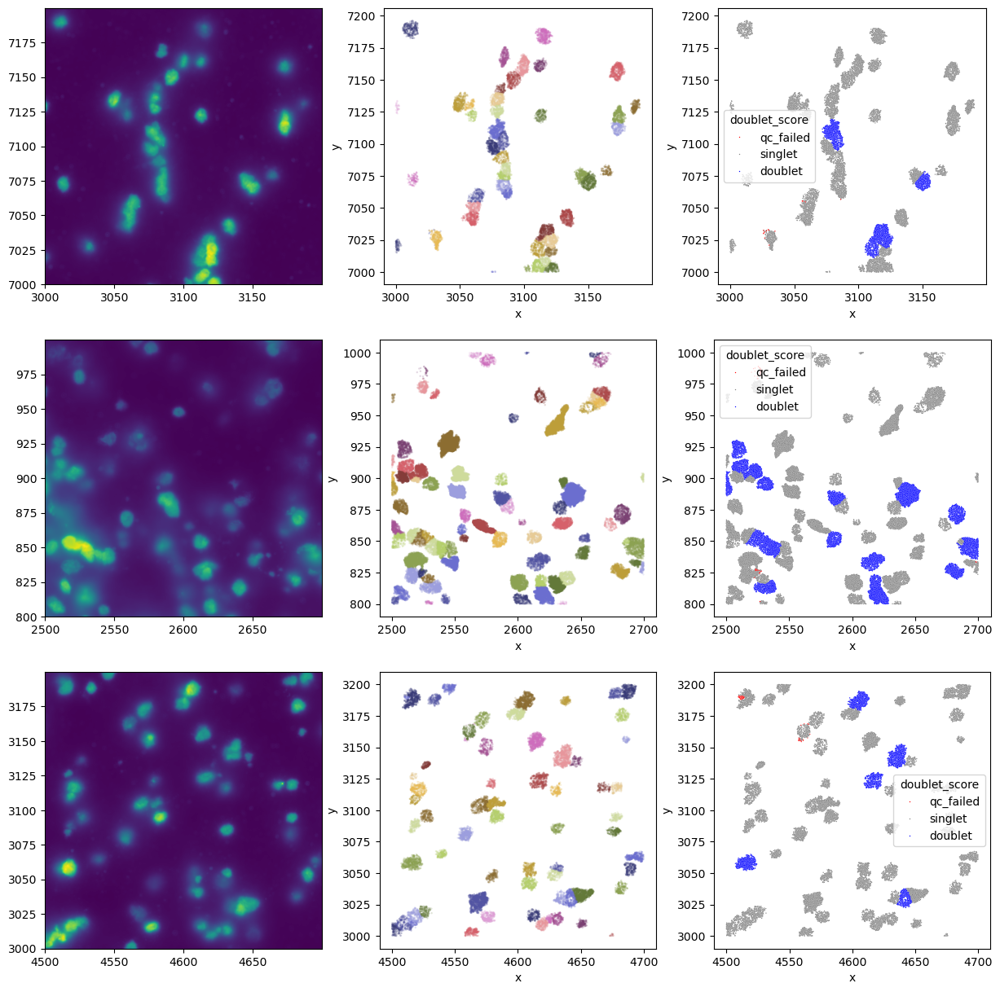

In [44]:
# Zoom in on some high predicted doublet areas
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(15, 15))
for i, subrgn in enumerate(subrgns):
    subtable = spot_table.get_subregion(xlim=subrgn[0], ylim=subrgn[1])
    subtable.get_image(channel='DAPI').show(ax=ax[i, 0])

    subtable.filter_cells(real_cells=True).scatter_plot(color='cell', size=3, ax=ax[i, 1])
    subtable_df = subtable.dataframe()
    subtable_df['cell_ids'] = subtable_df['cell_ids'].astype(str)
    subtable_df = subtable_df.merge(cell_by_gene.obs, left_on='cell_ids', right_index=True)
    sns.scatterplot(data=subtable_df, x='x', y='y', palette=['red', 'grey', 'blue'], hue='doublet_score', ax=ax[i, 2], s=1)
    ax[i, 2].set_aspect('equal')

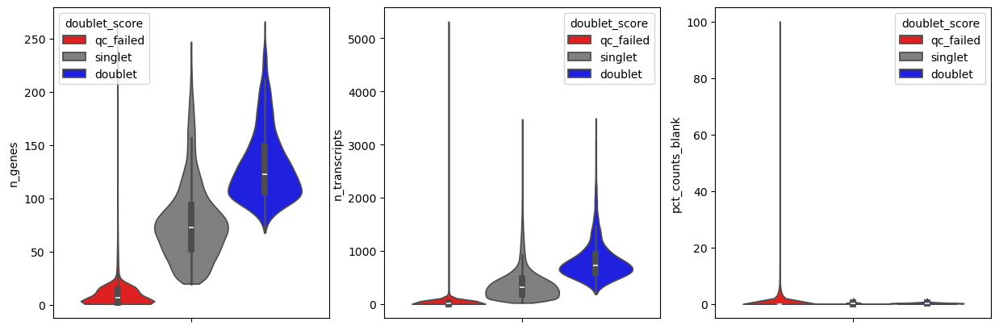

In [45]:
# Plot QC parameters of predicted doublets
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))
for i, param in enumerate(cell_by_gene.uns['qc_params']):
    sns.violinplot(data=cell_by_gene.obs, y=param, cut=0, ax=ax[i], palette=['red', 'grey', 'blue'], hue='doublet_score')
    
qc_plot_path = merscope_section.qc_path / doublet_timestamp / 'doublet_qc_violins.png'
plt.savefig(qc_plot_path, dpi=300)

In [46]:
# Save sp_anndata
merscope_section.make_anndata()

## Mapping

In [47]:
merscope_section.get_mappings()

In [49]:
from sawg.celltype_mapping import ScrattchMapping
from sawg import CellTypeMapping

# note that as written that doublets are also mapped
# could inspect/filter them out later
map_args = {'ad_sp_layer': 'logcounts', 'cell_qc': 'cell_qc_pass'}  
hpc_args = {'docker': 'singularity exec --cleanenv docker://njjai/scrattch_mapping:0.51', 'hpc_host': 'hpc-login'}
taxonomy = 'AIT115'

# calculate log counts for Scrattch Mapping
cell_by_gene.var['probe_type'] = np.where(cell_by_gene.var_names.str.startswith('Blank'), 'blank', 'gene')
cell_by_gene.layers['logcounts'] = np.log1p(cell_by_gene.X)

# write anndata file
merscope_section.make_anndata()

# run mapping
job, mapping = merscope_section.run_mapping_on_section(ScrattchMapping, taxonomy=taxonomy, method_args=map_args, hpc_args=hpc_args)

... storing 'probe_type' as categorical


loading spatial data from \\allen\programs\celltypes\workgroups\rnaseqanalysis\NHP_spatial\MERSCOPE\macaque\1291816006\sp_anndata.h5ad...


c:\users\stephanies\spatial-analysis-wg\code\sawg\celltype_mapping.py:644: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  ad_map.uns['taxonomy_path'] = self.taxonomy_path


Setting run directory to //allen/programs/celltypes/workgroups/rnaseqanalysis/NHP_spatial/MERSCOPE/macaque/1291816006/mapping
Mapping UID: 1704826679.282
building HPC job
<JobState PENDING> 13956852


In [52]:
job.state()

<JobState NO_INFO>

c:\users\stephanies\spatial-analysis-wg\code\sawg\celltype_mapping.py:711: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(data=subdata, x=level, y='score.Corr', ax=ax[i], order=group, **violin)
c:\users\stephanies\spatial-analysis-wg\code\sawg\celltype_mapping.py:713: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_xticklabels(ax[i].get_xticklabels(), rotation = 45, ha='right')
c:\users\stephanies\spatial-analysis-wg\code\sawg\celltype_mapping.py:711: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(data=subdata, x=level, y='score.Corr', ax=ax[i], order=group, **violin)
c:\users\stephanies\spatial-analysis-wg\code\sawg\celltype_mapping.py:713: UserWarning: set_ticklabels() should only be

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


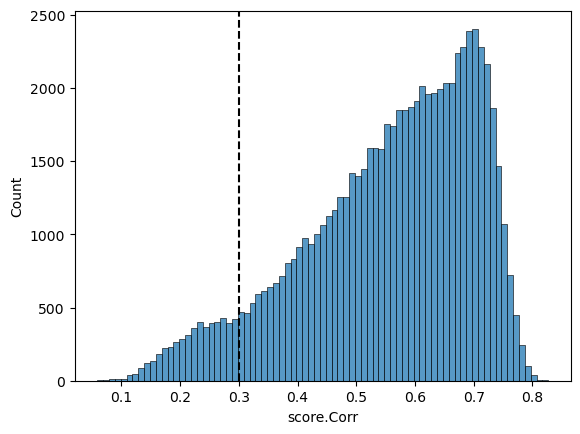

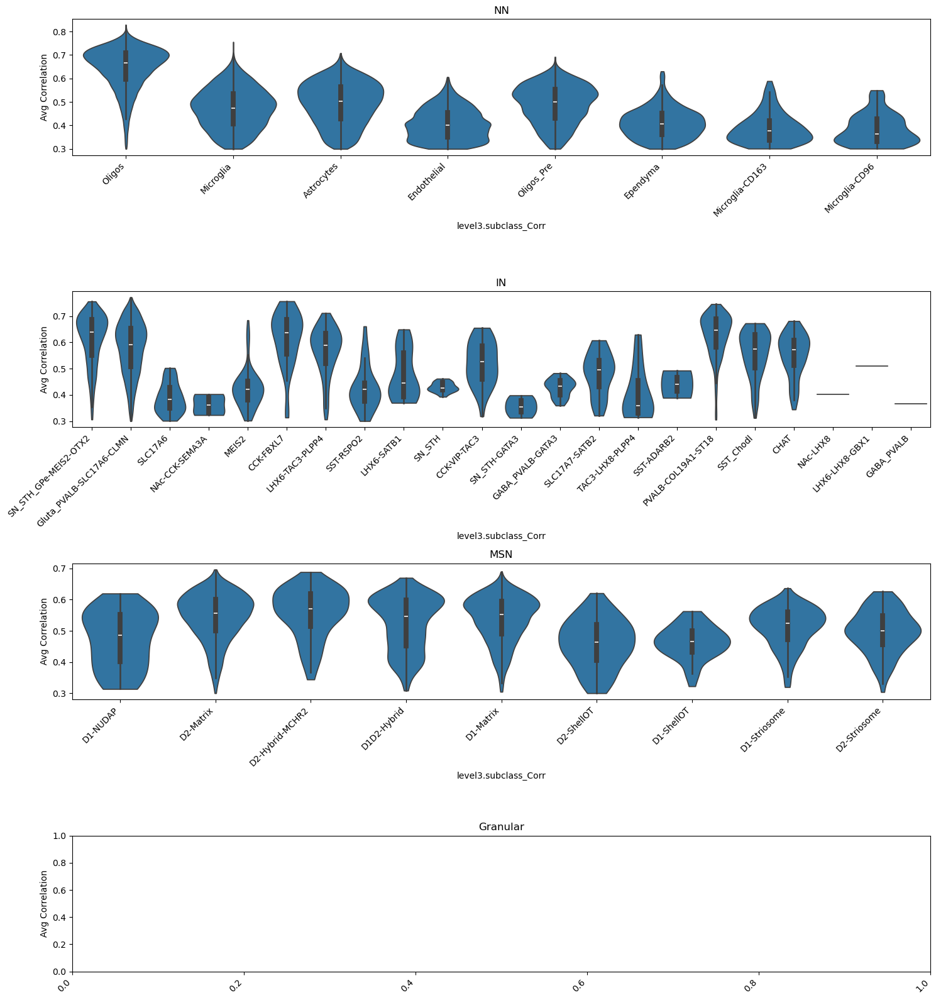

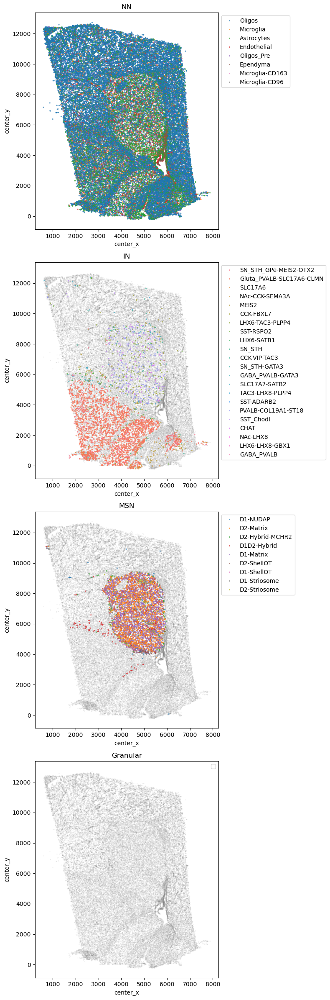

In [65]:
merscope_section.view_mapping_results(ct_map=mapping, ct_level='subclass', score_thresh=0.3)

In [67]:
cirro_file = merscope_section.make_cirro(mapping)

loading results...
No scrattch_map_temp.h5ad file found in run directory, checking for previously saved results...


... storing 'level1.class_Corr' as categorical
... storing 'level2.neighborhood_Corr' as categorical
... storing 'level3.subclass_Corr' as categorical
... storing 'cluster_Corr' as categorical
... storing 'mapping_qc' as categorical


\\allen\programs\celltypes\workgroups\rnaseqanalysis\NHP_spatial\MERSCOPE\macaque\1291816006\mapping\1704826679.282\ad_cirro_QM23.50.001.CX.45.01.07.02.h5ad
